In [1]:
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import scanpy.external as sce

In [2]:
# import session_info
# session_info.show()

In [3]:
sc.settings.set_figure_params(dpi=80)

# Read in adata

In [4]:
path_adata = '/lustre/scratch126/cellgen/team205/kk18/xenium/objects/foetal/C194-HEA-0-FFPE-1_Hst45-HEA-0-FFPE-1_concat_5K_filtered_raw.h5ad'
adata = sc.read_h5ad(path_adata)
adata

AnnData object with n_obs × n_vars = 362277 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'n_genes', 'tissue_block_id', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'fine_grain_8Dec2024', 'multi_celltypes_coarse', 'cluster_cellcharter', 'fine_grain_4Jan2025', 'sliding_window_assignment', 'globalX', 'globalY', 'predicted_labels_sliding_window_assignment', 'conf_score_sliding_window_assignmen

In [5]:
os.getcwd()

'/nfs/team205/kk18/notebooks/Foetal/Xenium/5K/C194_Hst45'

In [6]:
adata.X.data[:5]

array([5., 1., 1., 2., 2.], dtype=float32)

# Log-normalisation

In [7]:
# log-normalise the count
sc.pp.normalize_total(adata,target_sum=1e4)
sc.pp.log1p(adata)
adata.X.data[:5]

array([4.2093534, 2.6576407, 2.6576407, 3.3151019, 3.3151019],
      dtype=float32)

# Plot cell types

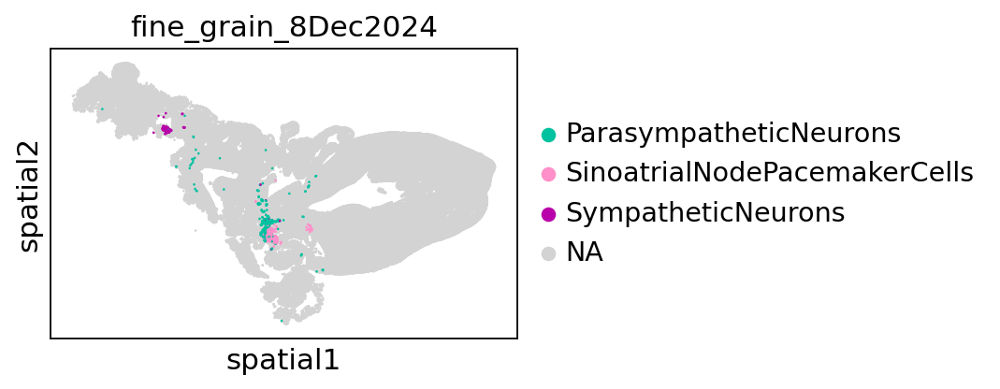

In [12]:
tissue_id = 'C194-HEA-0-FFPE-1'
slide = adata[adata.obs['tissue_block_id']==tissue_id]
sc.pl.spatial(slide,color=['fine_grain_8Dec2024'],
              groups=['SinoatrialNodePacemakerCells','ParasympatheticNeurons','SympatheticNeurons'],
              spot_size=60,vmax='p100',
             )

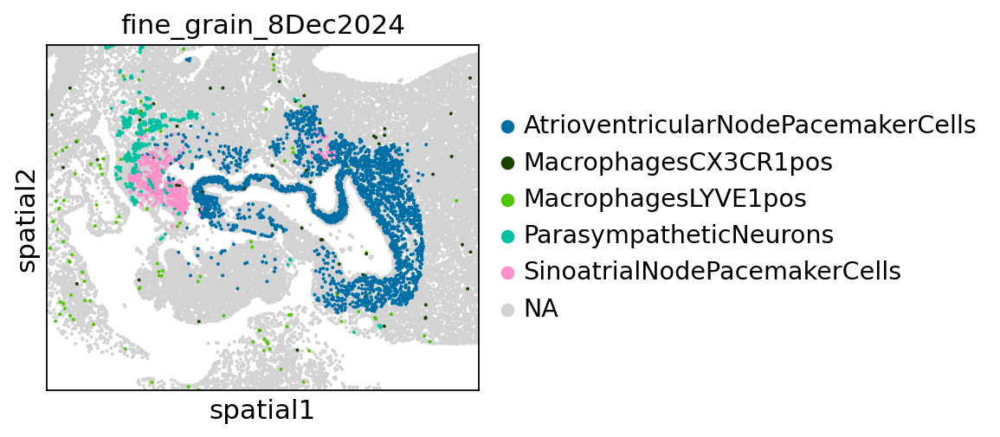

In [8]:
tissue_id = 'C194-HEA-0-FFPE-1'
slide = adata[adata.obs['tissue_block_id']==tissue_id]
sc.pl.spatial(slide,color=['fine_grain_8Dec2024'],
              groups=['SinoatrialNodePacemakerCells','AtrioventricularNodePacemakerCells','ParasympatheticNeurons','MacrophagesCX3CR1pos','MacrophagesLYVE1pos'],
              spot_size=20,vmax='p100',
              crop_coord=(4500,7000,4000,6000)
             )

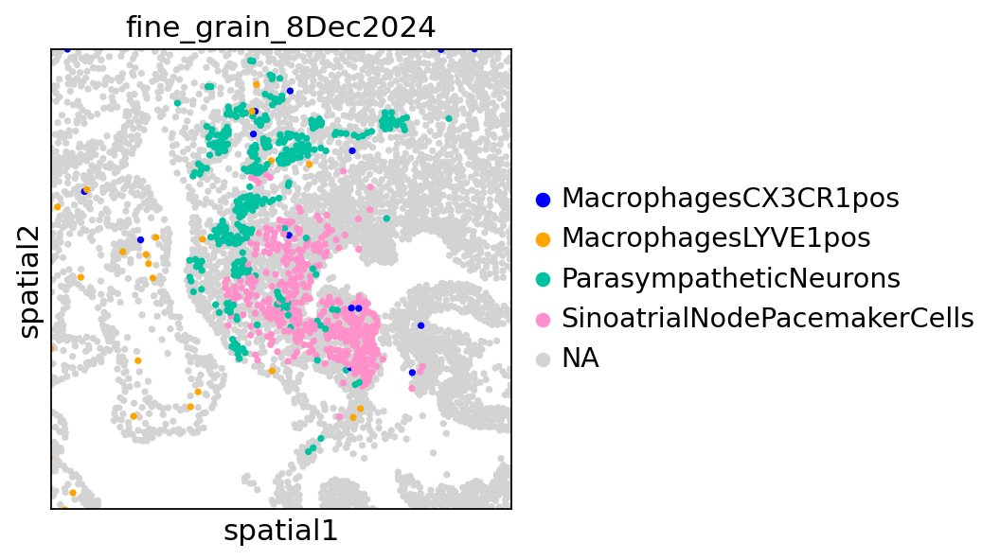

In [22]:
tissue_id = 'C194-HEA-0-FFPE-1'
celltype_key = 'fine_grain_8Dec2024'
slide = adata[adata.obs['tissue_block_id']==tissue_id]

slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('MacrophagesCX3CR1pos')]='blue'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('MacrophagesLYVE1pos')]='orange'

sc.pl.spatial(slide,color=[celltype_key],
              groups=['SinoatrialNodePacemakerCells','ParasympatheticNeurons','MacrophagesCX3CR1pos','MacrophagesLYVE1pos'],
              spot_size=15,vmax='p100',
              crop_coord=(4600,5600,4250,5250)
             )

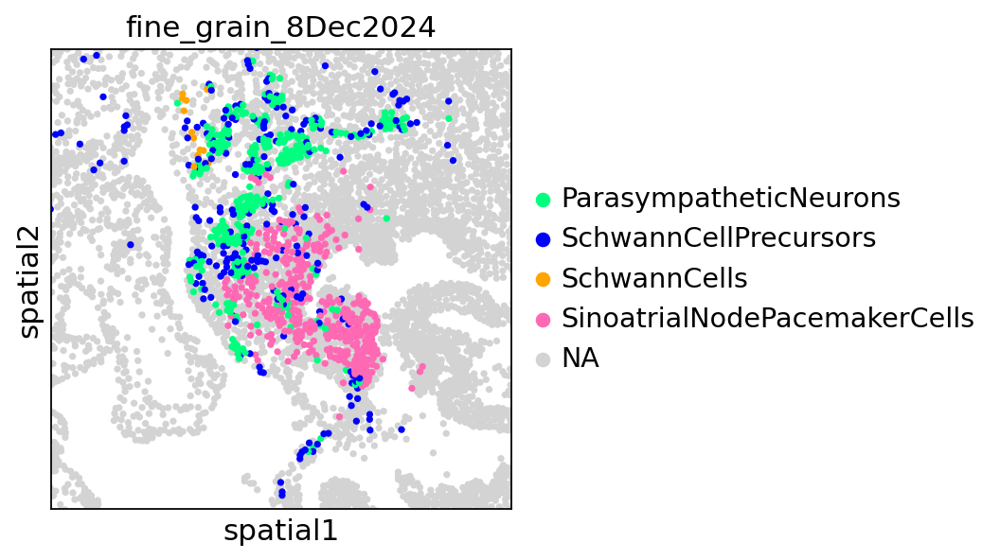

In [8]:
tissue_id = 'C194-HEA-0-FFPE-1'
celltype_key = 'fine_grain_8Dec2024'
slide = adata[adata.obs['tissue_block_id']==tissue_id]

slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('ParasympatheticNeurons')]='springgreen'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('SinoatrialNodePacemakerCells')]='hotpink'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('SchwannCellPrecursors')]='blue'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('SchwannCells')]='orange'

sc.pl.spatial(slide,color=[celltype_key],
              groups=['SinoatrialNodePacemakerCells','ParasympatheticNeurons','SchwannCells','SchwannCellPrecursors'],
              spot_size=15,vmax='p100',
              crop_coord=(4600,5600,4250,5250)
             )

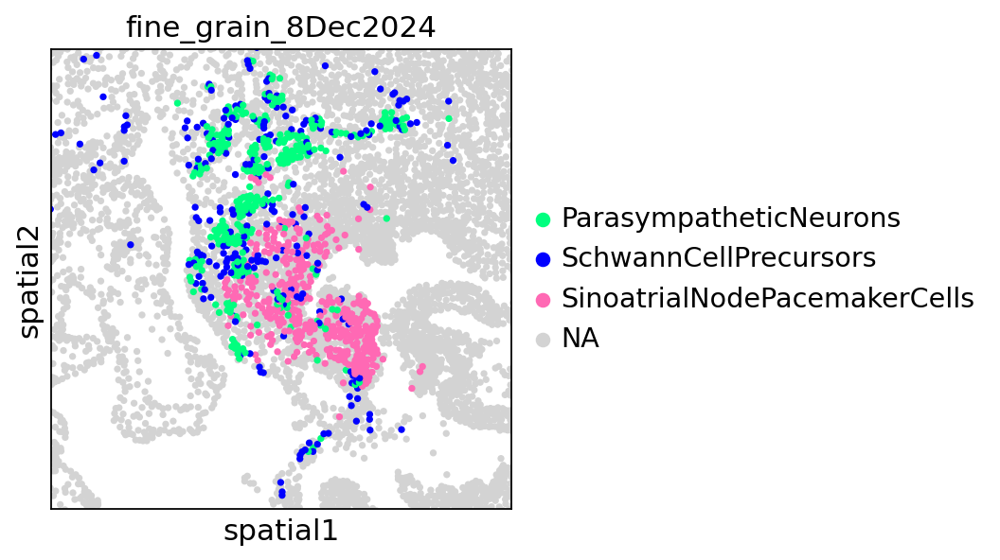

In [9]:
tissue_id = 'C194-HEA-0-FFPE-1'
celltype_key = 'fine_grain_8Dec2024'
slide = adata[adata.obs['tissue_block_id']==tissue_id]

slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('ParasympatheticNeurons')]='springgreen'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('SinoatrialNodePacemakerCells')]='hotpink'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('SchwannCellPrecursors')]='blue'
# slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('SchwannCells')]='orange'

sc.pl.spatial(slide,color=[celltype_key],
              groups=['SinoatrialNodePacemakerCells','ParasympatheticNeurons','SchwannCellPrecursors'],
              spot_size=15,vmax='p100',
              crop_coord=(4600,5600,4250,5250)
             )

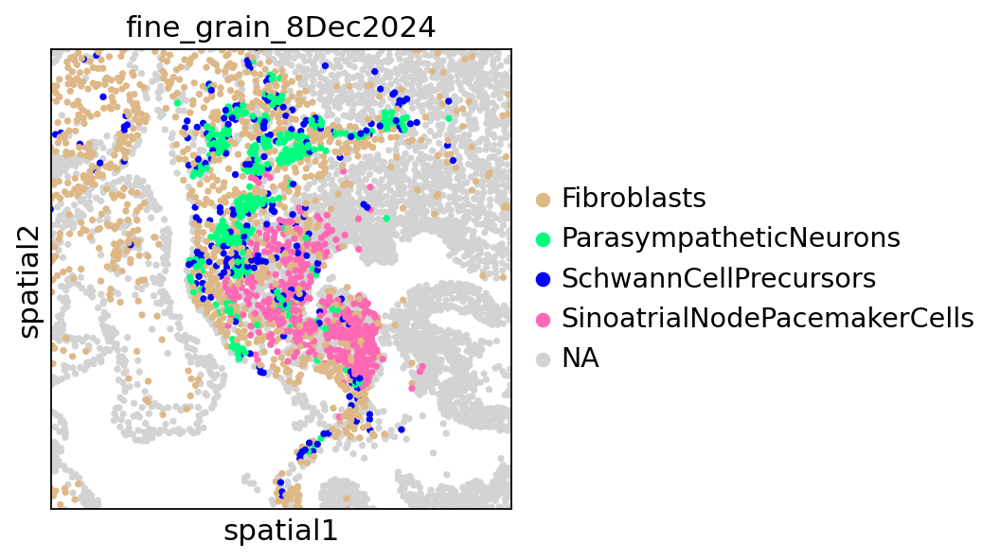

In [12]:
tissue_id = 'C194-HEA-0-FFPE-1'
celltype_key = 'fine_grain_8Dec2024'
slide = adata[adata.obs['tissue_block_id']==tissue_id]

slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('ParasympatheticNeurons')]='springgreen'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('SinoatrialNodePacemakerCells')]='hotpink'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('SchwannCellPrecursors')]='blue'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('Fibroblasts')]='burlywood'

sc.pl.spatial(slide,color=[celltype_key],
              groups=['SinoatrialNodePacemakerCells','ParasympatheticNeurons','SchwannCellPrecursors','Fibroblasts'],
              spot_size=15,vmax='p100',
              crop_coord=(4600,5600,4250,5250)
             )

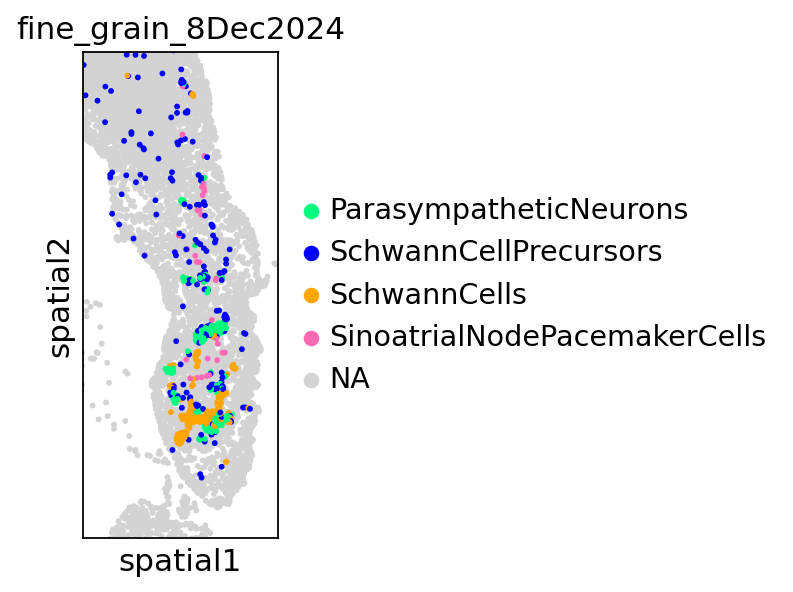

In [9]:
tissue_id = 'Hst45-HEA-0-FFPE-1'
celltype_key = 'fine_grain_8Dec2024'
slide = adata[adata.obs['tissue_block_id']==tissue_id]

slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('ParasympatheticNeurons')]='springgreen'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('SinoatrialNodePacemakerCells')]='hotpink'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('SchwannCellPrecursors')]='blue'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('SchwannCells')]='orange'

sc.pl.spatial(slide,color=[celltype_key],
              groups=['SinoatrialNodePacemakerCells','ParasympatheticNeurons','SchwannCells','SchwannCellPrecursors'],
              spot_size=30,vmax='p100',
              crop_coord=(6000,7000,500,3000)
             )

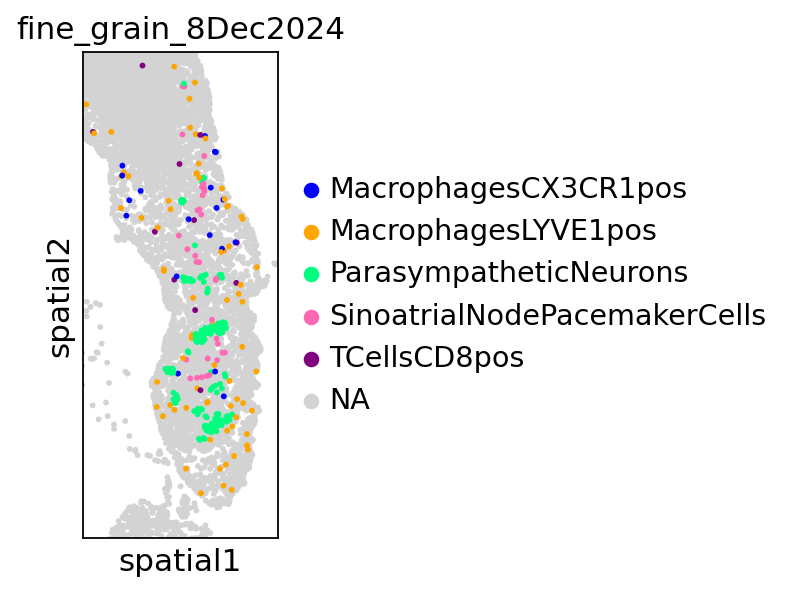

In [14]:
tissue_id = 'Hst45-HEA-0-FFPE-1'
celltype_key = 'fine_grain_8Dec2024'
slide = adata[adata.obs['tissue_block_id']==tissue_id]

slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('ParasympatheticNeurons')]='springgreen'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('SinoatrialNodePacemakerCells')]='hotpink'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('MacrophagesCX3CR1pos')]='blue'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('MacrophagesLYVE1pos')]='orange'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('TCellsCD8pos')]='purple'

sc.pl.spatial(slide,color=[celltype_key],
              groups=['SinoatrialNodePacemakerCells','ParasympatheticNeurons','MacrophagesCX3CR1pos','MacrophagesLYVE1pos','TCellsCD8pos'],
              spot_size=30,vmax='p100',
              crop_coord=(6000,7000,500,3000)
             )

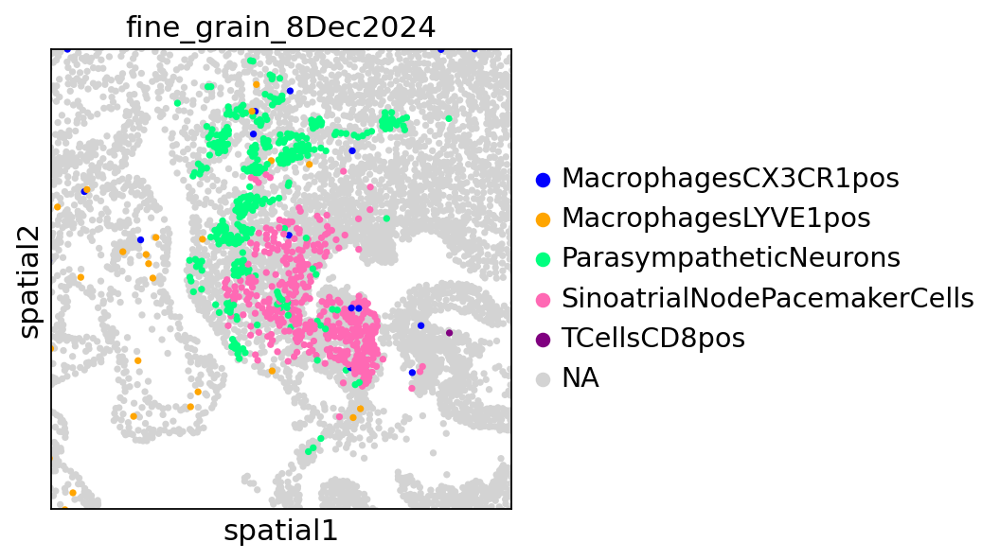

In [15]:
tissue_id = 'C194-HEA-0-FFPE-1'
celltype_key = 'fine_grain_8Dec2024'
slide = adata[adata.obs['tissue_block_id']==tissue_id]

slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('ParasympatheticNeurons')]='springgreen'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('SinoatrialNodePacemakerCells')]='hotpink'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('MacrophagesCX3CR1pos')]='blue'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('MacrophagesLYVE1pos')]='orange'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('TCellsCD8pos')]='purple'

sc.pl.spatial(slide,color=[celltype_key],
              groups=['SinoatrialNodePacemakerCells','ParasympatheticNeurons','MacrophagesCX3CR1pos','MacrophagesLYVE1pos','TCellsCD8pos'],
              spot_size=15,vmax='p100',
              crop_coord=(4600,5600,4250,5250)
             )

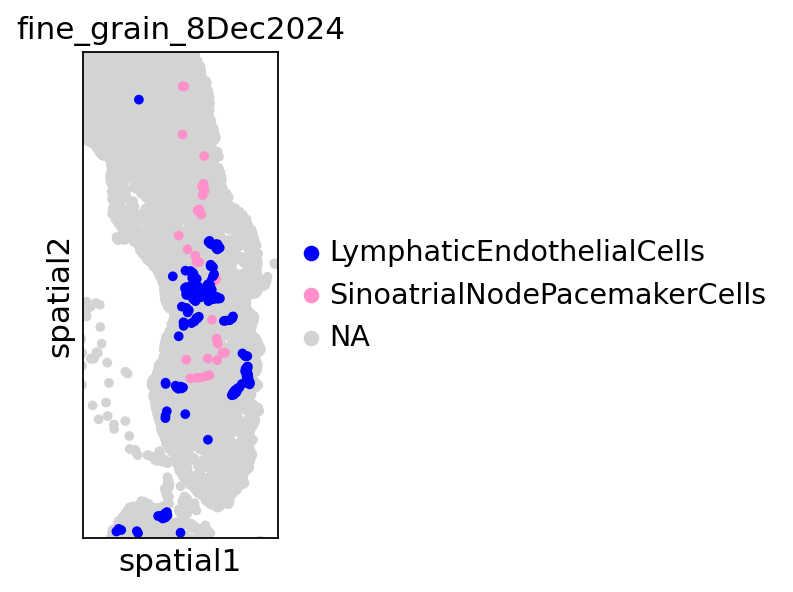

In [10]:
tissue_id = 'Hst45-HEA-0-FFPE-1'
celltype_key = 'fine_grain_8Dec2024'
slide = adata[adata.obs['tissue_block_id']==tissue_id]

slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('LymphaticEndothelialCells')]='blue'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('MacrophagesLYVE1pos')]='orange'

sc.pl.spatial(slide,color=[celltype_key],
              groups=['SinoatrialNodePacemakerCells','LymphaticEndothelialCells'],
              spot_size=50,vmax='p100',
              crop_coord=(6000,7000,500,3000)
             )

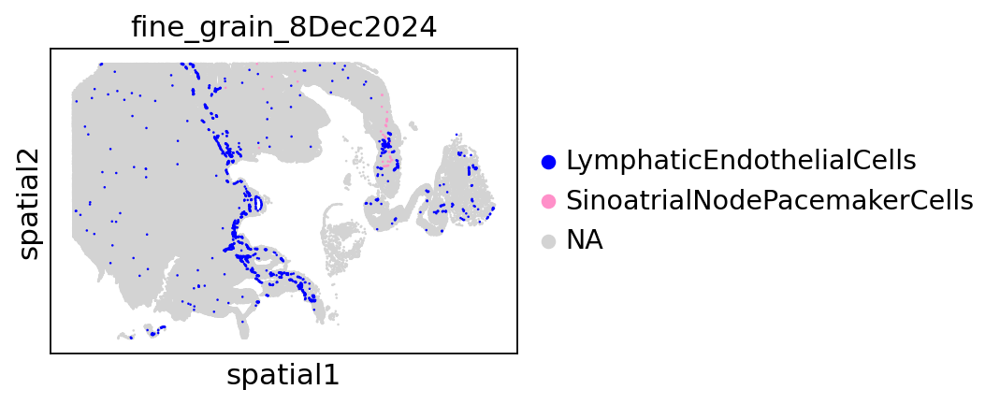

In [11]:
tissue_id = 'Hst45-HEA-0-FFPE-1'
celltype_key = 'fine_grain_8Dec2024'
slide = adata[adata.obs['tissue_block_id']==tissue_id]

slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('LymphaticEndothelialCells')]='blue'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('MacrophagesLYVE1pos')]='orange'

sc.pl.spatial(slide,color=[celltype_key],
              groups=['SinoatrialNodePacemakerCells','LymphaticEndothelialCells'],
              spot_size=50,vmax='p100',
             )

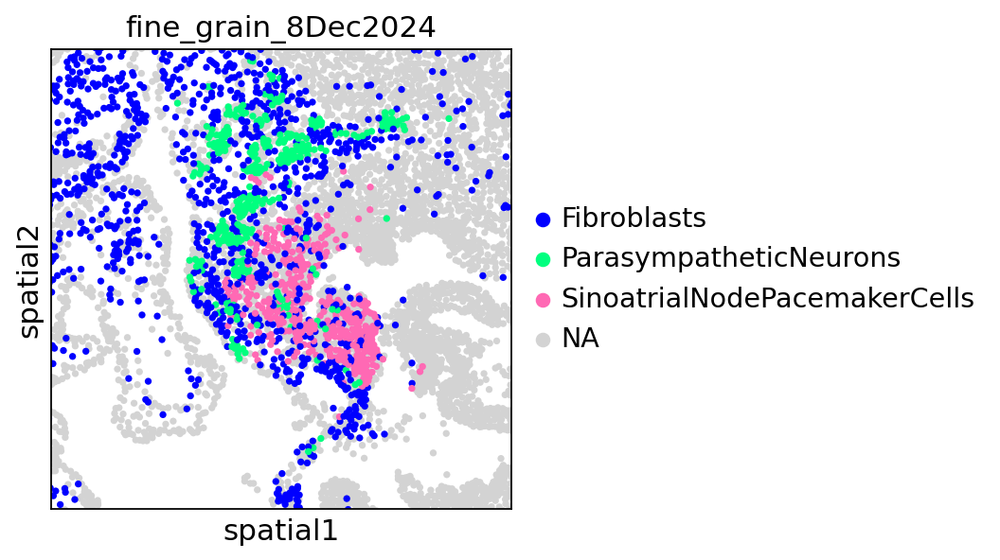

In [18]:
tissue_id = 'C194-HEA-0-FFPE-1'
celltype_key = 'fine_grain_8Dec2024'
slide = adata[adata.obs['tissue_block_id']==tissue_id]

slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('ParasympatheticNeurons')]='springgreen'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('SinoatrialNodePacemakerCells')]='hotpink'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('Fibroblasts')]='blue'

sc.pl.spatial(slide,color=[celltype_key],
              groups=['SinoatrialNodePacemakerCells','ParasympatheticNeurons','Fibroblasts'],
              spot_size=15,vmax='p100',
              crop_coord=(4600,5600,4250,5250)
             )

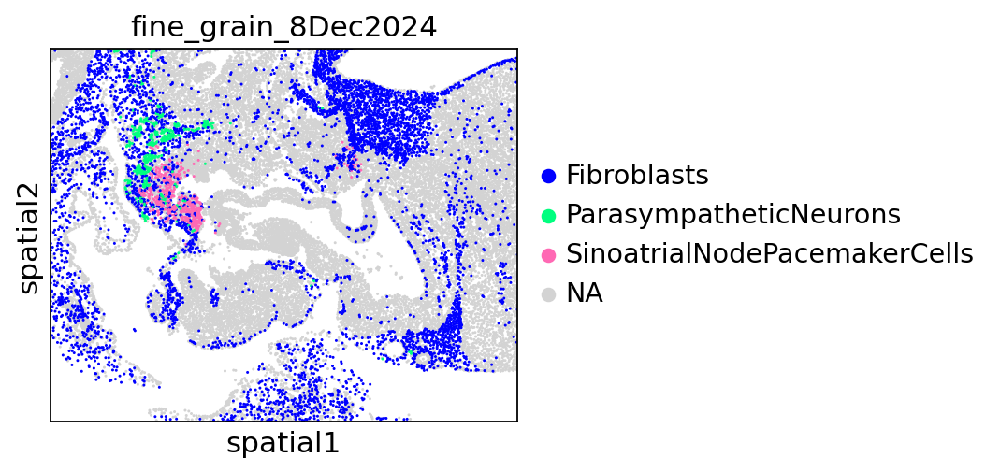

In [21]:
tissue_id = 'C194-HEA-0-FFPE-1'
celltype_key = 'fine_grain_8Dec2024'
slide = adata[adata.obs['tissue_block_id']==tissue_id]

slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('ParasympatheticNeurons')]='springgreen'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('SinoatrialNodePacemakerCells')]='hotpink'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('Fibroblasts')]='blue'

sc.pl.spatial(slide,color=[celltype_key],
              groups=['SinoatrialNodePacemakerCells','ParasympatheticNeurons','Fibroblasts'],
              spot_size=15,vmax='p100',
              crop_coord=(4500,7000,4000,6000)
             )

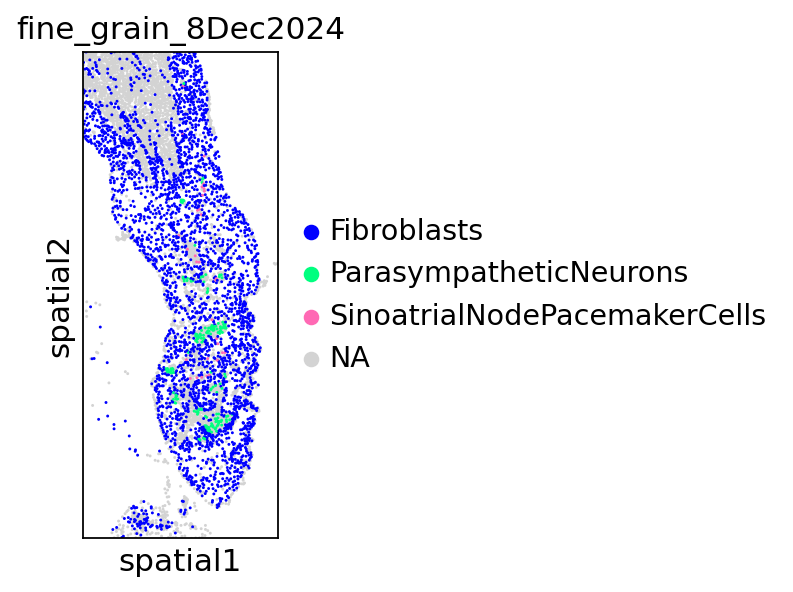

In [20]:
tissue_id = 'Hst45-HEA-0-FFPE-1'
celltype_key = 'fine_grain_8Dec2024'
slide = adata[adata.obs['tissue_block_id']==tissue_id]

slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('ParasympatheticNeurons')]='springgreen'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('SinoatrialNodePacemakerCells')]='hotpink'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('Fibroblasts')]='blue'

sc.pl.spatial(slide,color=[celltype_key],
              groups=['SinoatrialNodePacemakerCells','ParasympatheticNeurons','Fibroblasts'],
              spot_size=15,vmax='p100',
              crop_coord=(6000,7000,500,3000)
             )

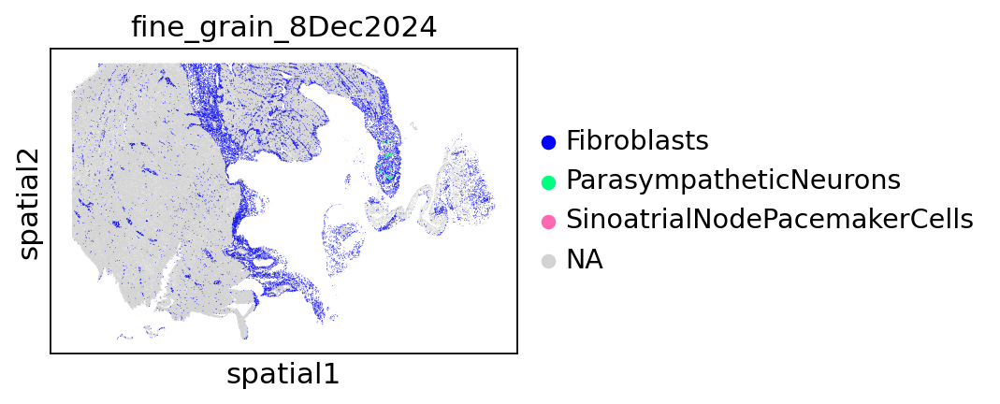

In [22]:
tissue_id = 'Hst45-HEA-0-FFPE-1'
celltype_key = 'fine_grain_8Dec2024'
slide = adata[adata.obs['tissue_block_id']==tissue_id]

slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('ParasympatheticNeurons')]='springgreen'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('SinoatrialNodePacemakerCells')]='hotpink'
slide.uns[f"{celltype_key}_colors"][list(slide.obs[celltype_key].cat.categories).index('Fibroblasts')]='blue'

sc.pl.spatial(slide,color=[celltype_key],
              groups=['SinoatrialNodePacemakerCells','ParasympatheticNeurons','Fibroblasts'],
              spot_size=15,vmax='p100',
             )

# Plot genes

In [10]:
genes = ['SEMA3A', 'SLIT2', 'SLIT3', 'EFNB2', 'CXCL12', 'FGF10', 'VEGFC', 'NELL1']
genes = [x for x in genes if x in adata.var_names]
genes

['SEMA3A', 'SLIT2', 'SLIT3', 'EFNB2', 'CXCL12', 'FGF10', 'VEGFC', 'NELL1']

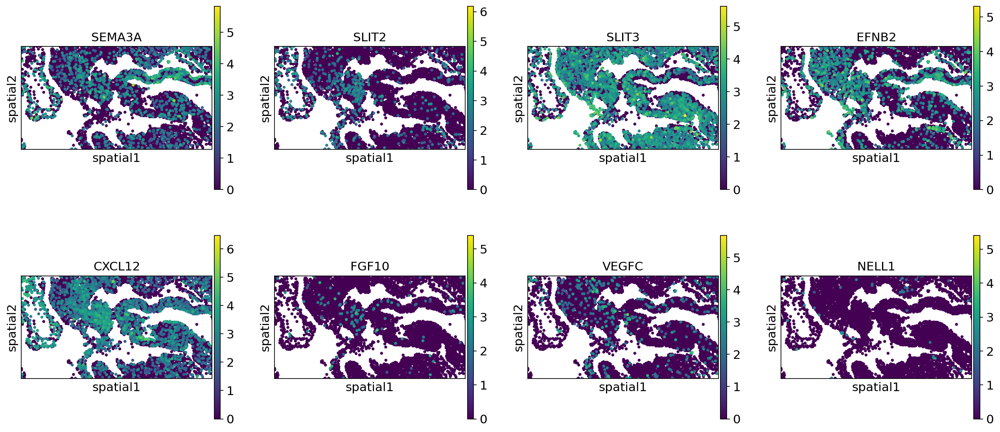

In [14]:
tissue_id = 'C194-HEA-0-FFPE-1'
slide = adata[adata.obs['tissue_block_id']==tissue_id]
sc.pl.spatial(slide,color=genes,
              spot_size=20,vmax='p100',
              crop_coord=(4700,6000,4600,5300)
             )

# Plot LR

In [20]:
genes = ['SEMA3A', 'SLIT2', 'SLIT3', 'EFNB2', 'CXCL12', 'FGF10', 'VEGFC', 'NELL1']
genes = [x for x in genes if x in adata.var_names]
genes

['SEMA3A', 'SLIT2', 'SLIT3', 'EFNB2', 'CXCL12', 'FGF10', 'VEGFC', 'NELL1']

In [19]:
cpdb_metadata = pd.read_csv('/nfs/team205/heart/cellphonedb/customDB/interaction_meta/interaction_metadata_v5.0.0_2024-1-26.csv')
lr_genes = cpdb_metadata[['gene_name_1', 'gene_name_2']].copy()
print(lr_genes.shape)
lr_genes.head()

(2911, 2)


,gene_name_1,gene_name_2
0,CDH1,"ITGB1,ITGA2"
1,COL10A1,"ITGB1,ITGA2"
2,COL11A1,"ITGB1,ITGA2"
3,COL11A2,"ITGB1,ITGA2"
4,COL12A1,"ITGB1,ITGA2"


In [27]:
for i,gene in enumerate(genes):
    mask1 = np.array([gene in x.split(',') for x in lr_genes['gene_name_1']])
    mask2 = np.array([gene in x.split(',') for x in lr_genes['gene_name_2']])
    df = lr_genes.loc[mask1|mask2]
    if i==0:
        lr_genes_sel = df.copy()
    else:
        lr_genes_sel = pd.concat([lr_genes_sel,df])
lr_genes_sel.drop_duplicates(inplace=True)
lr_genes_sel.index = range(len(lr_genes_sel))
lr_genes_sel

,gene_name_1,gene_name_2
0,SEMA3A,NRP1
1,SEMA3A,"NRP1,PLXNA1"
2,SEMA3A,"NRP1,PLXNA2"
3,SEMA3A,"NRP1,PLXNA3"
4,SEMA3A,"NRP1,PLXNA4"
5,SLIT2,ROBO1
6,SLIT2,ROBO2
7,EFNB2,EPHA4
8,EFNB2,EPHB2
9,EFNB2,EPHB1


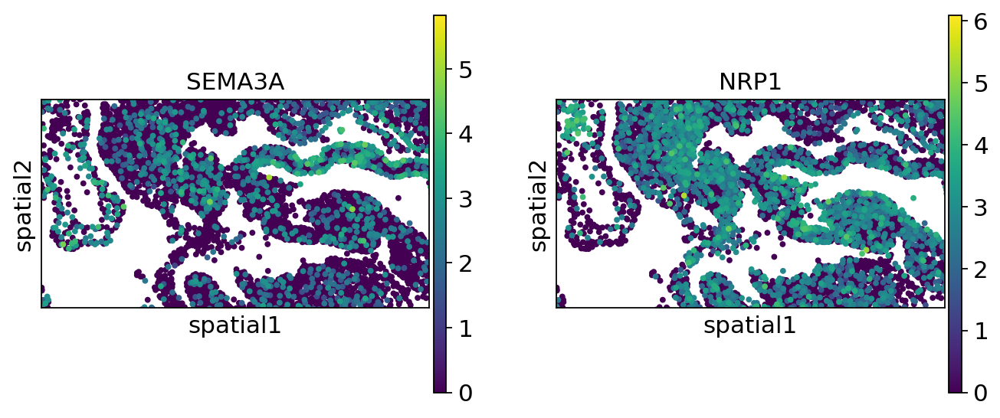

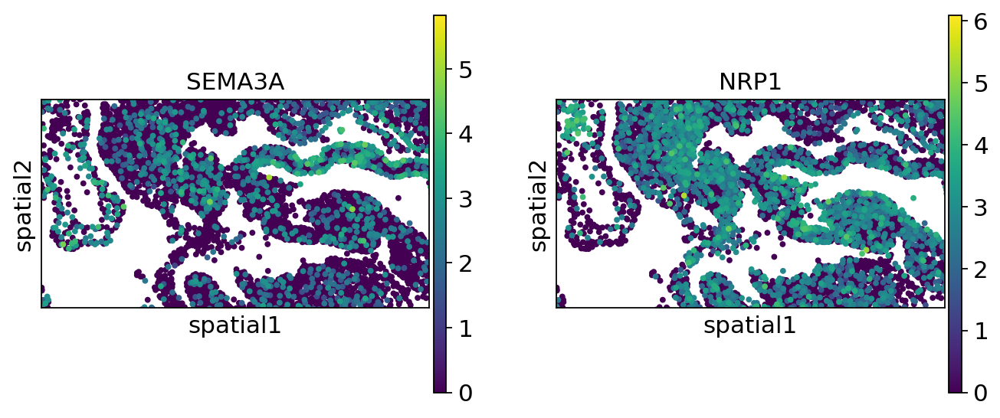

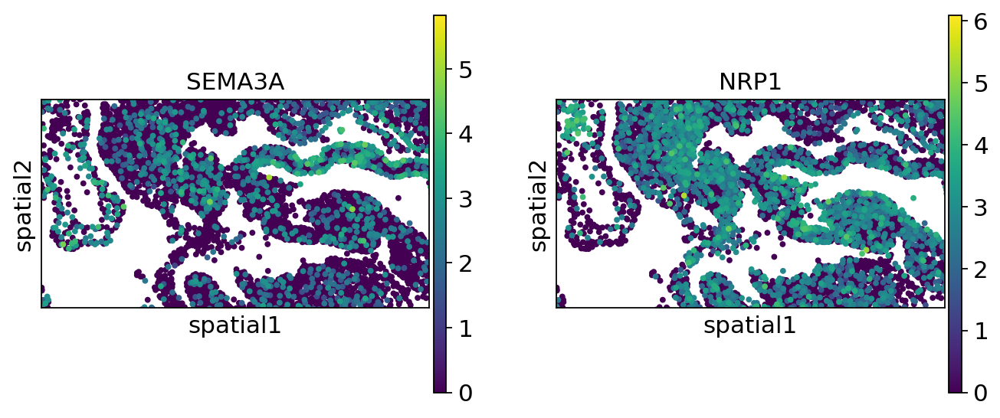

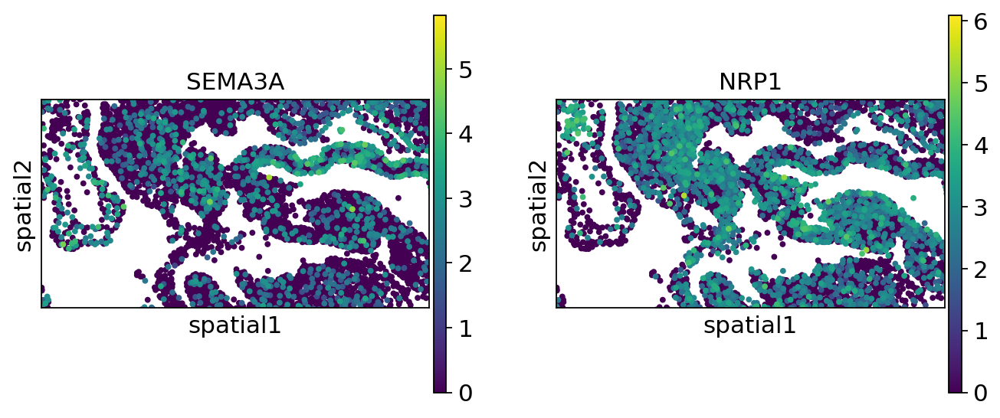

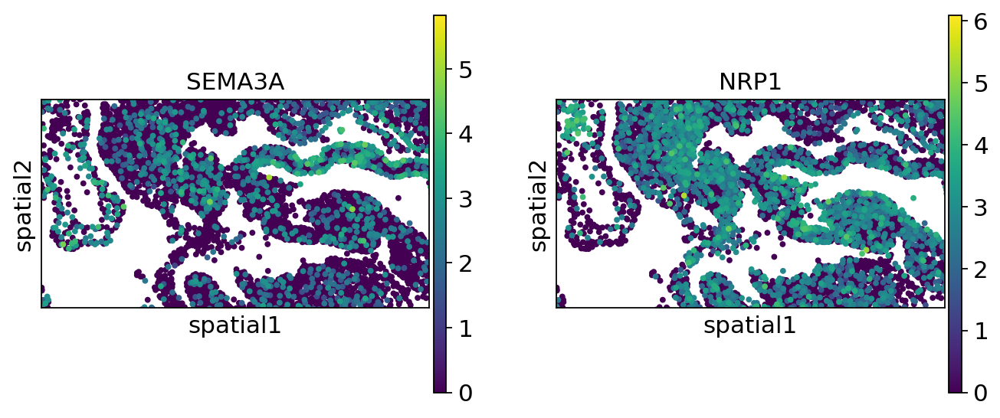

...

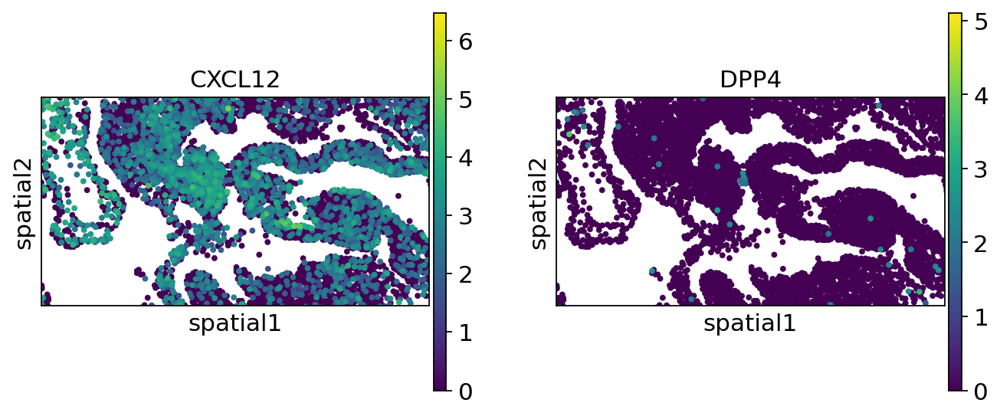

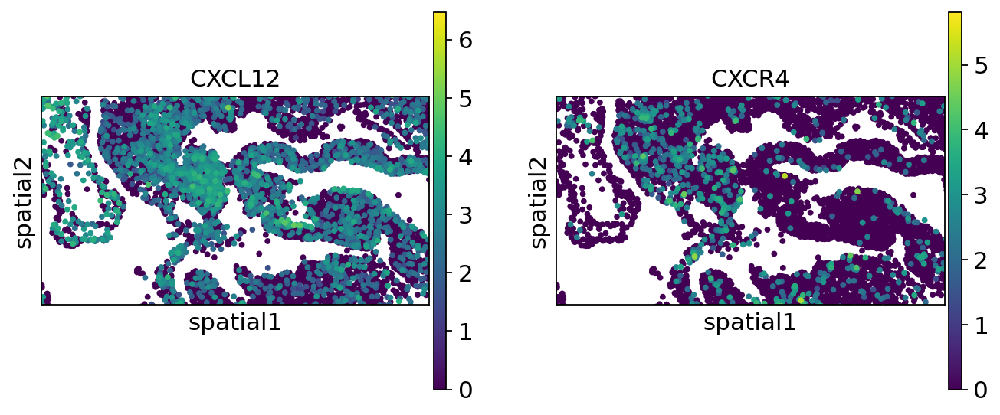

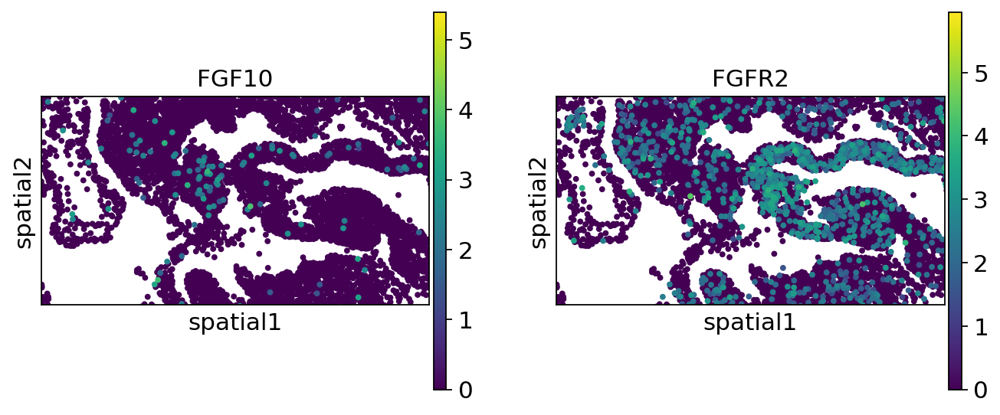

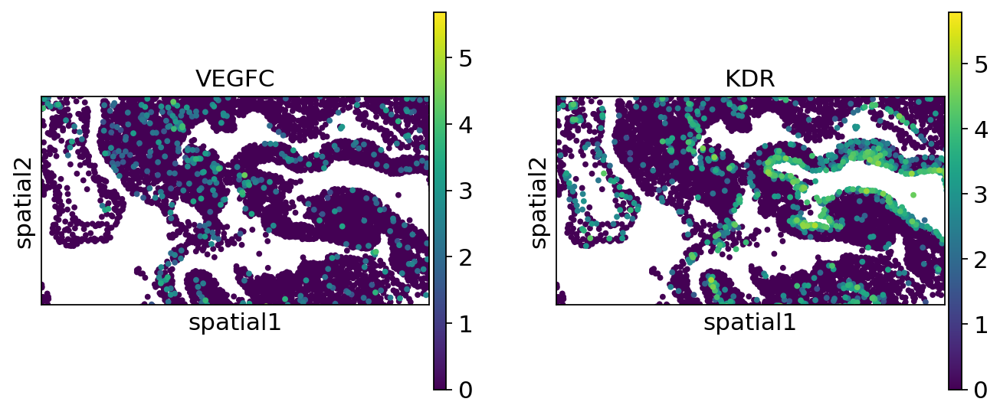

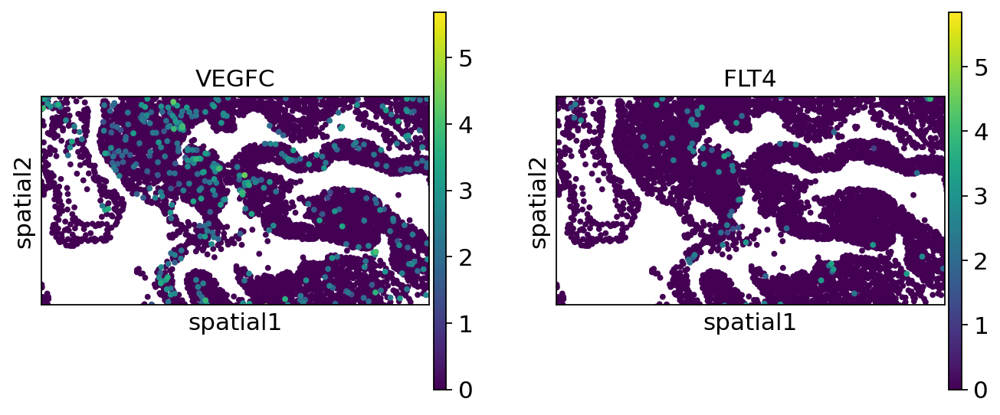

In [30]:
tissue_id = 'C194-HEA-0-FFPE-1'
slide = adata[adata.obs['tissue_block_id']==tissue_id]

for ind in lr_genes_sel.index:
    g = lr_genes_sel.loc[ind,'gene_name_1'].split(',')+lr_genes_sel.loc[ind,'gene_name_2'].split(',')
    g = [x for x in g if x in adata.var_names]
    sc.pl.spatial(slide,color=g,
              spot_size=20,vmax='p100',
              crop_coord=(4700,6000,4600,5300)
             )

In [30]:
for tissue_id in ['C194-HEA-0-FFPE-1', 'Hst45-HEA-0-FFPE-1']:
    slide = adata[adata.obs['tissue_block_id']==tissue_id]
    df = slide.obs[['cell_id','fine_grain_8Dec2024']]
    df.columns = ['cell_id','group']
    df.to_csv(f'./{tissue_id}_cellgroup_XR_8Dec2024.csv',index=False)

# Plot axonal genes

In [8]:
genes = ['TUBB3', 'MAP2', 'ARC', 'SLC18A3', 'SLC5A7', 'CAMK2A']
genes = [x for x in genes if x in adata.var_names]
genes

['TUBB3', 'MAP2', 'ARC', 'SLC5A7', 'CAMK2A']

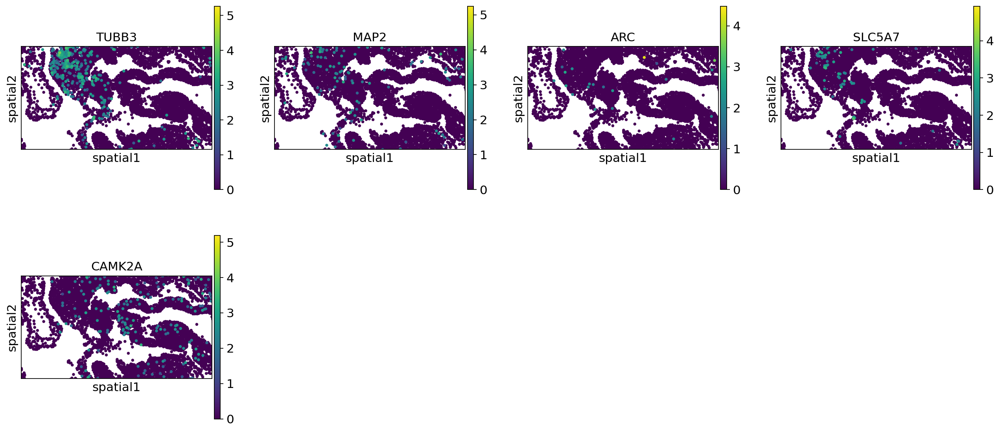

In [9]:
tissue_id = 'C194-HEA-0-FFPE-1'
slide = adata[adata.obs['tissue_block_id']==tissue_id]
sc.pl.spatial(slide,color=genes,
              spot_size=20,vmax='p100',
              crop_coord=(4700,6000,4600,5300)
             )

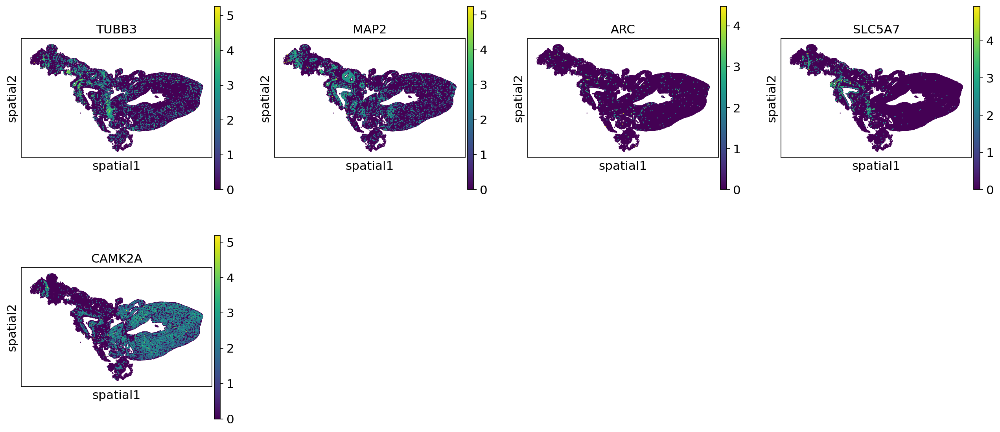

In [10]:
tissue_id = 'C194-HEA-0-FFPE-1'
slide = adata[adata.obs['tissue_block_id']==tissue_id]
sc.pl.spatial(slide,color=genes,
              spot_size=60,vmax='p100',
              # crop_coord=(4700,6000,4600,5300)
             )